В данном коде GAN обучен генерировать лица людей, проведена оценка качества генерации

В качестве обучающей выборки взята часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset)

In [ ]:
# Commented out IPython magic to ensure Python compatibility.
import os
from torch.utils.data import Dataset,DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch.optim as optim
from PIL import Image

# %matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

In [ ]:
""" Часть 1. Подготовка данных

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024).
Оригинальный датасет очень большой, взята его часть (3143 photos).
It is provided by NVIDIA under the Creative Commons BY-NC-SA 4.0 license.
It offers 70,000 PNG images at 1024×1024 resolution that display diverse ages, ethnicities, image backgrounds, and accessories like hats and eyeglasses.
"""


'''
Функция, которая строит DataLoader для изображений.
Меняет размер изображений до нужного значения (размер 1024 слишком большой, поэтому взят размер 136)
'''
class FacesDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Датасет для загрузки изображений лиц
        root_dir: Директория с изображениями
        transform: Преобразования для изображений
        """
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(root_dir) if f.endswith('.png') or f.endswith('.jpg')]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.image_files[idx])
        image = Image.open(img_name).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, 0  # 0 - фиктивная метка класса, не используется при обучении GAN


def get_dataloader(image_size, batch_size):
    """
    Builds dataloader for training data.
    Use tt.Compose and tt.Resize for transformations
    :param image_size: height and wdith of the image
    :param batch_size: batch_size of the dataloader
    :returns: DataLoader object
    """
    # TODO: resize images, convert them to tensors and build dataloader
    # Определяем параметры нормализации

    stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

    # Создаем набор трансформаций как В исходном коде для датасета кошек
    transform = tt.Compose([
        tt.Resize(image_size),
        tt.CenterCrop(image_size),
        tt.ToTensor(),
        tt.Normalize(*stats)
                            ])

    DATA_DIR = '/kaggle/input/faces-dataset-small/faces_dataset_small'
    # Создаем датасет
    train_ds = FacesDataset(DATA_DIR, transform=transform)

    # Создаем и возвращаем DataLoader
    train_dl = DataLoader(train_ds,
                           batch_size=batch_size,
                           shuffle=True,
                           num_workers=2,
                           pin_memory=True)

    return train_dl


image_size = 136
batch_size = 64

In [ ]:
data=get_dataloader(image_size, batch_size)

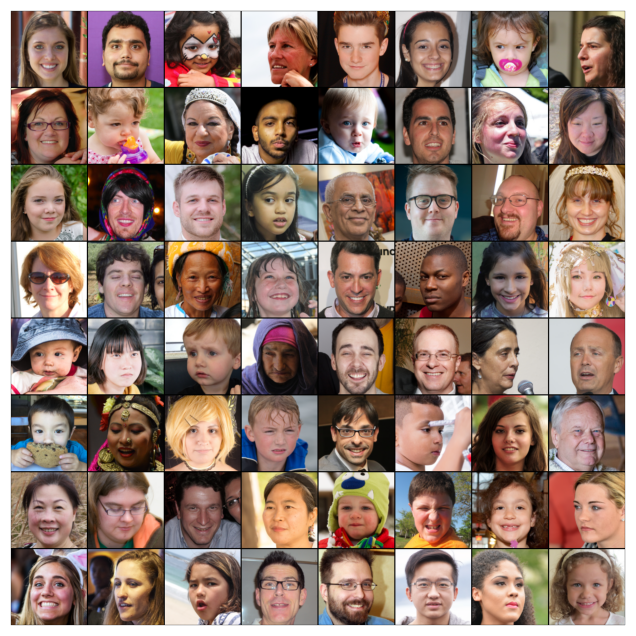

In [ ]:
# Функция для денормализации изображений
def denorm(img_tensors):
    stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
    return img_tensors * stats[1][0] + stats[0][0]

# Функция для отображения изображений из батча
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images), nrow=8).cpu().permute(1, 2, 0))

# Функция для отображения одного батча из DataLoader
def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images[:nmax])
        break

# Отображаем один батч из data
show_batch(data)

In [ ]:
class DeviceDataLoader():
    # Обертка для DataLoader, которая переносит данные на указанное устройство
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        # Возвращает батч данных после переноса на устройство
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        # количество батчей
        return len(self.dl)

def to_device(data, device):
    # Переносит тензоры на выбранное устройство
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [ ]:
#TODO: build dataloader and transfer it to device

"""
Часть 2. Построение и обучение модели
"""

latent_size = 128 # Размерность шума для генератора

# Дискриминатор (критик) для WGAN-GP
'''
Задача: анализировать полноразмерное изображение (3×136×136) и сжать его до скалярной оценки (1)
'''
class Discriminator(nn.Module):
    def __init__(self, image_size):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            # in: 3 x 136 x 136
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 64 x 68 x 68 Формула расчета выходного размера для Conv2d: output_size = [(input_size - kernel_size + 2*padding) / stride] + 1

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 128 x 34 x 34

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 256 x 17 x 17

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 512 x 8 x 8

            nn.Conv2d(512, 124, kernel_size=4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(124),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(124, 1, kernel_size=4, stride=1, padding=0, bias=False),

            # убрали sigmoid в конце,так как критик оценивает не вероятность, а реалистичность(Wasserstein расстояние)
            nn.Flatten(),  # Просто сделаем плоским, без активации sigmoid
        )

        # Инициализация весов
        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Conv2d):
            nn.init.normal_(m.weight.data, 0.0, 0.02)

    def forward(self, x):
        return self.model(x)



discriminator =  Discriminator(image_size)

In [ ]:
# Генератор для WGAN-GP
'''
расширение размерности
Задача: преобразовать низкоразмерный вектор шума (latent_size×1×1) в полноразмерное изображение (3×136×136)
'''
class Generator(nn.Module):
    def __init__(self, latent_size, image_size):
        super(Generator, self).__init__()

        # Вычисляем начальный размер для первого слоя (после свертки)
        initial_size = image_size // 16

        self.model = nn.Sequential(
            # in: latent_size x 1 x 1
            nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False), # принимает на вход тензор шумов размера `latent_size x 1 x 1`
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            # out: 512 x 4 x 4

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            # out: 256 x 8 x 8

            nn.ConvTranspose2d(256, 128, kernel_size=5, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # out: 128 x 17 x 17

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            # out: 64 x 34 x 34

            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            # size: 32 x 68 x 68

            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh() #  tanh-активацию на выходе для получения значений в диапазоне [-1, 1]
            # out: генерирует изображение размера `3 x image_size=136 x image_size`
        )

        # Инициализация весов
        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.ConvTranspose2d):
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        elif isinstance(m, nn.BatchNorm2d):
            nn.init.normal_(m.weight.data, 1.0, 0.02)
            nn.init.constant_(m.bias.data, 0)

    def forward(self, x):
        return self.model(x)

generator = Generator(latent_size, image_size)

In [ ]:
# Перемещение моделей на устройство
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
discriminator = discriminator.to(device)
generator = generator.to(device)

In [ ]:
"""Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет

В качестве функции потерь берем бинарную кросс-энтропию


ОДНАКО
Для WGAN-GP не подходит бинарная кросс-энтропия, так как дискриминатор (критик) не выдаёт вероятности, а рассчитывает Wasserstein расстояние -mean(real_validity) + mean(fake_validity)
"""

'Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:\n1. Учим дискриминатор:\n  * берем реальные изображения и присваиваем им метку 1\n  * генерируем изображения генератором и присваиваем им метку 0\n  * обучаем классификатор на два класса\n\n2. Учим генератор:\n  * генерируем изображения генератором и присваиваем им метку 0\n  * предсказываем дискриминаторором, реальное это изображение или нет\n\nВ качестве функции потерь берем бинарную кросс-энтропию\n\n\nОДНАКО\nДля WGAN-GP не подходит бинарная кросс-энтропия, так как дискриминатор (критик) не выдаёт вероятности, а рассчитывает Wasserstein расстояние -mean(real_validity) + mean(fake_validity)\n'

In [ ]:
'''
Добавлен градиентный штраф для обеспечения 1-Липшицевости критика
BCE используется -mean(fake_validity)
Используются другие параметры beta1 и beta2 (0.5 и 0.9)
'''

def compute_gradient_penalty(discriminator, real_samples, fake_samples, device):
    """
    реализует ключевую особенность WGAN-GP - градиентный штраф,
    который стабилизирует обучение и позволяет избежать проблем исчезающего или взрывного градиента
    """
    # Случайные веса для интерполяции
    alpha = torch.rand(real_samples.size(0), 1, 1, 1, device=device)

    # Интерполяция между реальными и сгенерированными изображениями
    interpolated = (alpha * real_samples + (1 - alpha) * fake_samples).requires_grad_(True)
    # Оценка дискриминатора для интерполированных изображений
    d_interpolated = discriminator(interpolated)

    # Вычисляем градиенты
    fake = torch.ones(real_samples.size(0), 1, device=device, requires_grad=False)
    gradients = torch.autograd.grad(
        outputs=d_interpolated,
        inputs=interpolated,
        grad_outputs=fake,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]

    # Вычисляем длину градиентов
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()

    return gradient_penalty

def fit(model, epochs, lr, lambda_gp=10, n_critic=5, device=None):
    """
    Обучение WGAN-GP
    :param model: словарь с моделями генератора и дискриминатора
    :param epochs: количество эпох обучения
    :param lr: скорость обучения
    :param lambda_gp: коэффициент для градиентного штрафа
    :param n_critic: количество обновлений критика на каждое обновление генератора
    :param device: устройство для вычислений
    """

    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Инициализация моделей
    discriminator = model["discriminator"].to(device)
    generator = model["generator"].to(device)

    # Создание оптимизаторов
    optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.9))
    optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.9))

    # Списки для отслеживания потерь
    losses_g = []
    losses_d = []

    # Фиксированный шум для проверки прогресса генератора
    fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

    # Создаём каталог для сохранения сгенерированных изображений
    sample_dir = '/kaggle/working/'
    os.makedirs(sample_dir, exist_ok=True)

    # Цикл обучения
    for epoch in range(epochs):
        loss_d_epoch = []
        loss_g_epoch = []

        for i, (real_images, _) in enumerate(tqdm(data, desc=f"Epoch {epoch+1}/{epochs}")):
            real_images = real_images.to(device)
            batch_size = real_images.size(0)

            # -------------------
            # Обучение дискриминатора
            # -------------------

            optimizer_d.zero_grad()

            # Генерация случайного шума
            z = torch.randn(batch_size, latent_size, 1, 1, device=device)

            # Генерация фальшивых изображений
            fake_images = generator(z)

            # Оценка реальных и поддельных изображений
            real_validity = discriminator(real_images)
            fake_validity = discriminator(fake_images.detach())

            # Вычисление градиентного штрафа
            gradient_penalty = compute_gradient_penalty(discriminator, real_images.data, fake_images.data, device)

            # Потери дискриминатора (критика): максимизируем Wasserstein расстояние
            d_loss = -torch.mean(real_validity) + torch.mean(fake_validity) + lambda_gp * gradient_penalty

            d_loss.backward()
            optimizer_d.step()
            loss_d_epoch.append(d_loss.item())

            # -------------------
            # Обучение генератора
            # -------------------

            # Обновляем генератор каждые n_critic итераций
            if i % n_critic == 0:
                optimizer_g.zero_grad()

                # Генерация нового шума
                z = torch.randn(batch_size, latent_size, 1, 1, device=device)
                fake_images = generator(z)

                # Оцениваем фальшивые изображения
                fake_validity = discriminator(fake_images)

                # Потери генератора: минимизируем отрицательную оценку от критика
                g_loss = -torch.mean(fake_validity)

                g_loss.backward()
                optimizer_g.step()
                loss_g_epoch.append(g_loss.item())

        # средние потери за эпоху
        losses_g.append(np.mean(loss_g_epoch))
        losses_d.append(np.mean(loss_d_epoch))

        print(f"Epoch {epoch+1}/{epochs}, Loss D: {losses_d[-1]:.4f}, Loss G: {losses_g[-1]:.4f}")

        # Сохраняем сгенерированные изображения в конце каждой эпохи
        with torch.no_grad():
            fake_images = generator(fixed_latent)
            fake_fname = f'generated-images-wgan-gp-{epoch+1:04d}.png'
            save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)

            # Показываем изображения
            if epoch % 10 == 0 or epoch == epochs - 1:
                show_images(fake_images.cpu())

    return losses_g, losses_d

Epoch 1/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1/90, Loss D: 5.5912, Loss G: 5.9152


Epoch 2/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 2/90, Loss D: -23.6456, Loss G: 18.5047


Epoch 3/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 3/90, Loss D: -30.2724, Loss G: 23.5770


Epoch 4/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 4/90, Loss D: -34.8688, Loss G: 28.3241


Epoch 5/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/90, Loss D: -32.1645, Loss G: 29.2068


Epoch 6/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 6/90, Loss D: -28.9785, Loss G: 28.8049


Epoch 7/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 7/90, Loss D: -26.7061, Loss G: 27.0392


Epoch 8/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 8/90, Loss D: -25.0961, Loss G: 26.1849


Epoch 9/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 9/90, Loss D: -24.6423, Loss G: 24.3101


Epoch 10/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 10/90, Loss D: -24.3686, Loss G: 24.9456


Epoch 11/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 11/90, Loss D: -24.7141, Loss G: 24.4117


Epoch 12/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 12/90, Loss D: -25.0388, Loss G: 25.6793


Epoch 13/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 13/90, Loss D: -25.0086, Loss G: 25.0707


Epoch 14/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 14/90, Loss D: -23.1780, Loss G: 25.0024


Epoch 15/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 15/90, Loss D: -22.6212, Loss G: 24.1765


Epoch 16/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 16/90, Loss D: -23.9900, Loss G: 24.3610


Epoch 17/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 17/90, Loss D: -24.4793, Loss G: 26.4760


Epoch 18/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 18/90, Loss D: -24.2212, Loss G: 26.4040


Epoch 19/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 19/90, Loss D: -24.4140, Loss G: 26.7260


Epoch 20/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 20/90, Loss D: -24.5819, Loss G: 27.6531


Epoch 21/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 21/90, Loss D: -24.9717, Loss G: 28.9750


Epoch 22/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 22/90, Loss D: -24.4624, Loss G: 27.8358


Epoch 23/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 23/90, Loss D: -24.2780, Loss G: 27.5691


Epoch 24/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 24/90, Loss D: -23.4631, Loss G: 28.5790


Epoch 25/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 25/90, Loss D: -23.9918, Loss G: 29.0620


Epoch 26/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 26/90, Loss D: -24.5105, Loss G: 28.9437


Epoch 27/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 27/90, Loss D: -24.0529, Loss G: 29.3448


Epoch 28/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 28/90, Loss D: -23.7131, Loss G: 28.6526


Epoch 29/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 29/90, Loss D: -23.1510, Loss G: 29.1041


Epoch 30/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 30/90, Loss D: -23.0919, Loss G: 30.3208


Epoch 31/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 31/90, Loss D: -23.0109, Loss G: 30.8935


Epoch 32/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 32/90, Loss D: -22.8005, Loss G: 32.5421


Epoch 33/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 33/90, Loss D: -22.8124, Loss G: 31.8363


Epoch 34/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 34/90, Loss D: -21.8337, Loss G: 31.4425


Epoch 35/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 35/90, Loss D: -22.3945, Loss G: 32.0481


Epoch 36/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 36/90, Loss D: -22.0484, Loss G: 31.8154


Epoch 37/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 37/90, Loss D: -22.1124, Loss G: 32.0359


Epoch 38/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 38/90, Loss D: -21.6706, Loss G: 31.9052


Epoch 39/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 39/90, Loss D: -21.4616, Loss G: 33.7662


Epoch 40/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 40/90, Loss D: -21.1544, Loss G: 32.6294


Epoch 41/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 41/90, Loss D: -21.3326, Loss G: 32.5828


Epoch 42/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 42/90, Loss D: -19.8669, Loss G: 32.6649


Epoch 43/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 43/90, Loss D: -20.7058, Loss G: 32.4816


Epoch 44/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 44/90, Loss D: -20.4281, Loss G: 32.8734


Epoch 45/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 45/90, Loss D: -20.2711, Loss G: 33.3422


Epoch 46/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 46/90, Loss D: -19.7874, Loss G: 32.2253


Epoch 47/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 47/90, Loss D: -19.7727, Loss G: 33.0598


Epoch 48/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 48/90, Loss D: -19.7788, Loss G: 33.6769


Epoch 49/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 49/90, Loss D: -19.7653, Loss G: 32.4107


Epoch 50/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 50/90, Loss D: -19.2312, Loss G: 32.7788


Epoch 51/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 51/90, Loss D: -19.6762, Loss G: 34.0396


Epoch 52/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 52/90, Loss D: -19.3522, Loss G: 32.7428


Epoch 53/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 53/90, Loss D: -20.4020, Loss G: 34.2304


Epoch 54/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 54/90, Loss D: -19.4556, Loss G: 34.9988


Epoch 55/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 55/90, Loss D: -18.8888, Loss G: 33.6036


Epoch 56/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 56/90, Loss D: -19.2165, Loss G: 34.6080


Epoch 57/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 57/90, Loss D: -19.7742, Loss G: 34.8130


Epoch 58/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 58/90, Loss D: -19.6406, Loss G: 34.5356


Epoch 59/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 59/90, Loss D: -19.1930, Loss G: 35.9766


Epoch 60/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 60/90, Loss D: -19.4789, Loss G: 35.3643


Epoch 61/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 61/90, Loss D: -18.3221, Loss G: 35.1234


Epoch 62/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 62/90, Loss D: -18.4202, Loss G: 34.8959


Epoch 63/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 63/90, Loss D: -18.3719, Loss G: 35.4614


Epoch 64/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 64/90, Loss D: -19.2761, Loss G: 36.5563


Epoch 65/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 65/90, Loss D: -18.8672, Loss G: 35.8117


Epoch 66/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 66/90, Loss D: -18.8910, Loss G: 36.3936


Epoch 67/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 67/90, Loss D: -18.6580, Loss G: 37.2888


Epoch 68/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 68/90, Loss D: -19.0014, Loss G: 37.9607


Epoch 69/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 69/90, Loss D: -18.2416, Loss G: 38.4771


Epoch 70/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 70/90, Loss D: -18.2856, Loss G: 37.7111


Epoch 71/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 71/90, Loss D: -18.1993, Loss G: 37.9375


Epoch 72/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 72/90, Loss D: -18.5023, Loss G: 39.4098


Epoch 73/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 73/90, Loss D: -18.6495, Loss G: 39.2053


Epoch 74/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 74/90, Loss D: -18.5156, Loss G: 39.7314


Epoch 75/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 75/90, Loss D: -18.7049, Loss G: 40.0427


Epoch 76/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 76/90, Loss D: -18.3450, Loss G: 39.0115


Epoch 77/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 77/90, Loss D: -18.5150, Loss G: 39.4609


Epoch 78/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 78/90, Loss D: -18.8223, Loss G: 40.3220


Epoch 79/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 79/90, Loss D: -19.0920, Loss G: 40.7554


Epoch 80/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 80/90, Loss D: -18.4476, Loss G: 40.4179


Epoch 81/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 81/90, Loss D: -18.7098, Loss G: 40.1144


Epoch 82/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 82/90, Loss D: -19.7055, Loss G: 41.8234


Epoch 83/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 83/90, Loss D: -18.5880, Loss G: 40.5268


Epoch 84/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 84/90, Loss D: -18.9398, Loss G: 41.1042


Epoch 85/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 85/90, Loss D: -19.1253, Loss G: 42.1118


Epoch 86/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 86/90, Loss D: -18.9672, Loss G: 41.5822


Epoch 87/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 87/90, Loss D: -18.8680, Loss G: 42.7585


Epoch 88/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 88/90, Loss D: -18.4537, Loss G: 41.5960


Epoch 89/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 89/90, Loss D: -19.0230, Loss G: 43.2237


Epoch 90/90:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 90/90, Loss D: -18.3435, Loss G: 42.3365


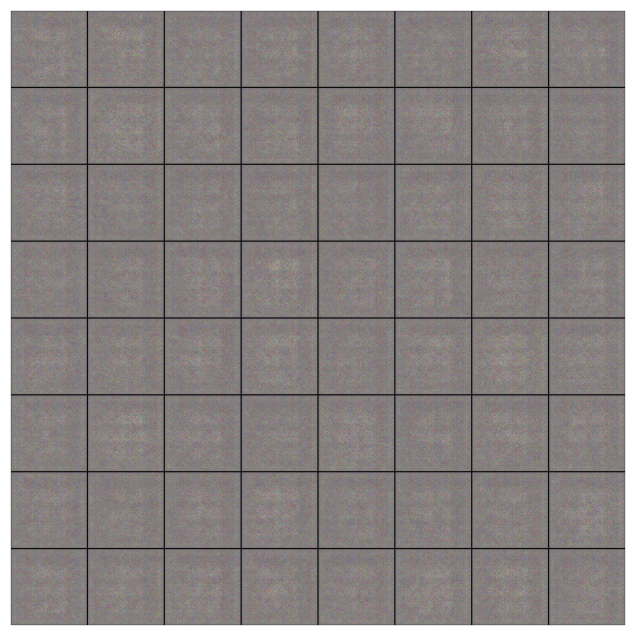

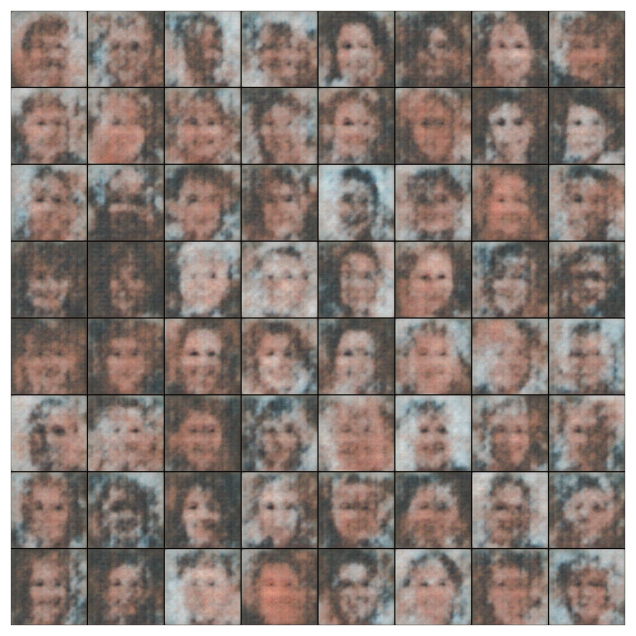

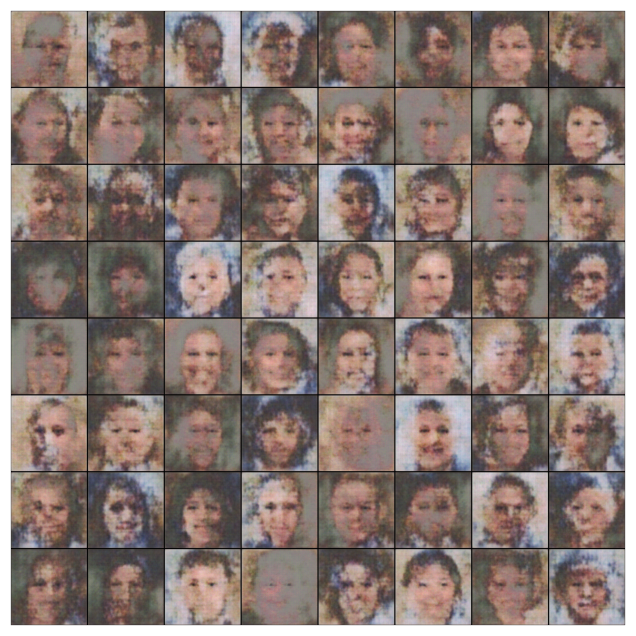

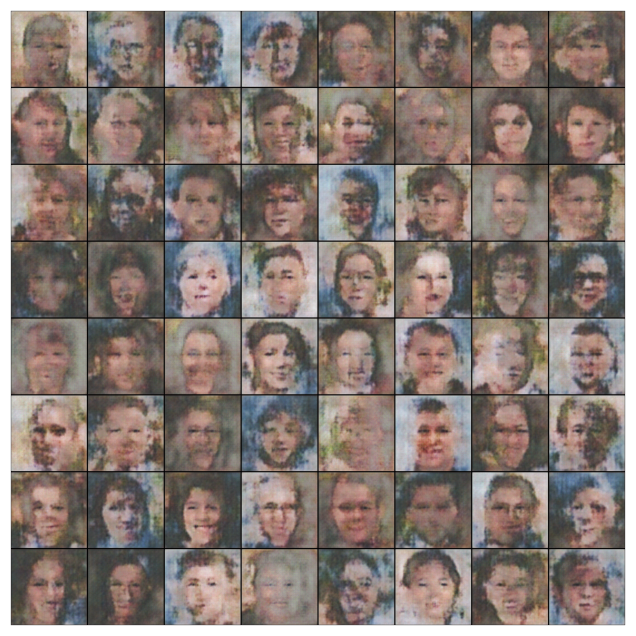

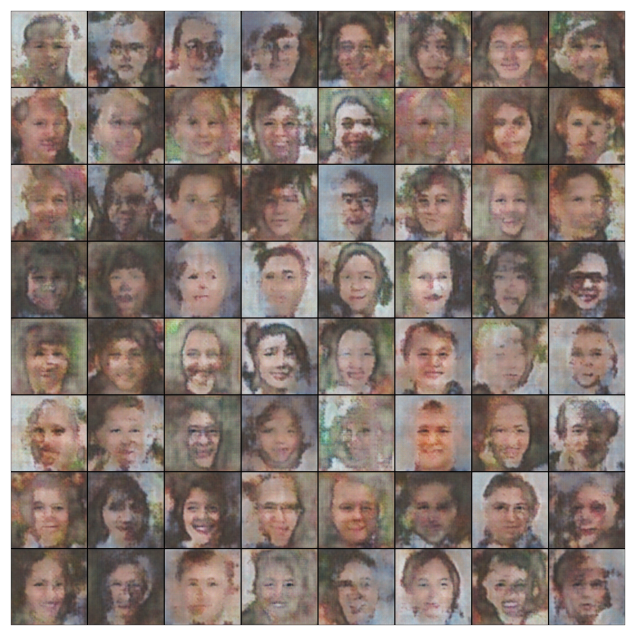

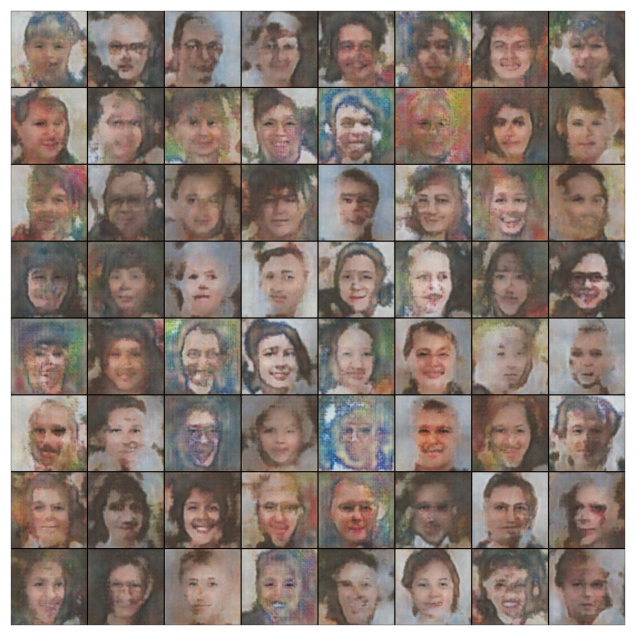

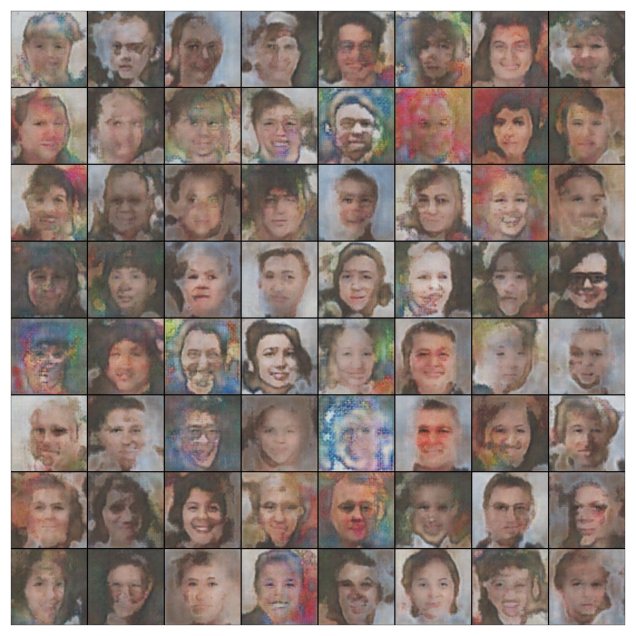

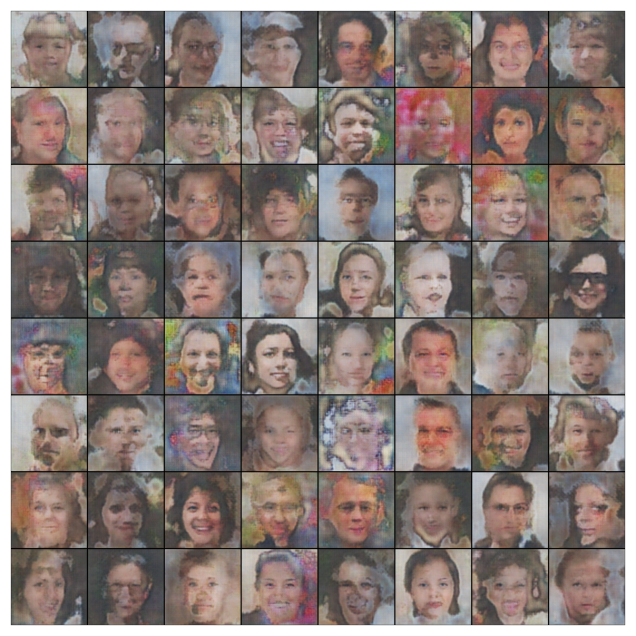

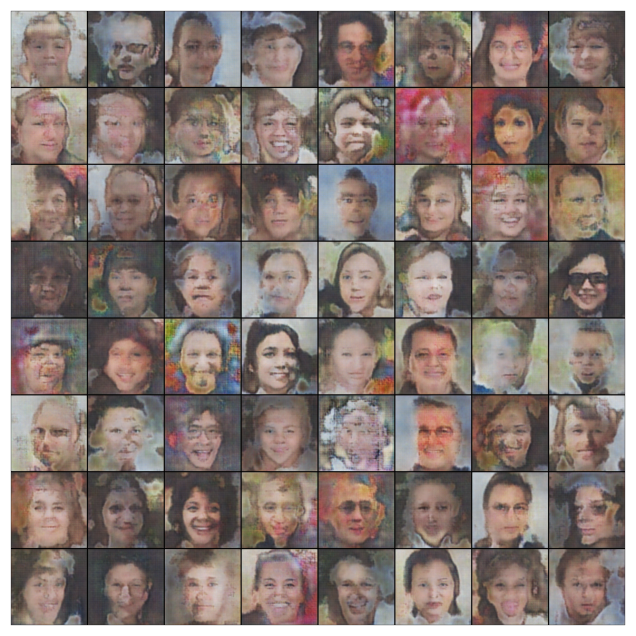

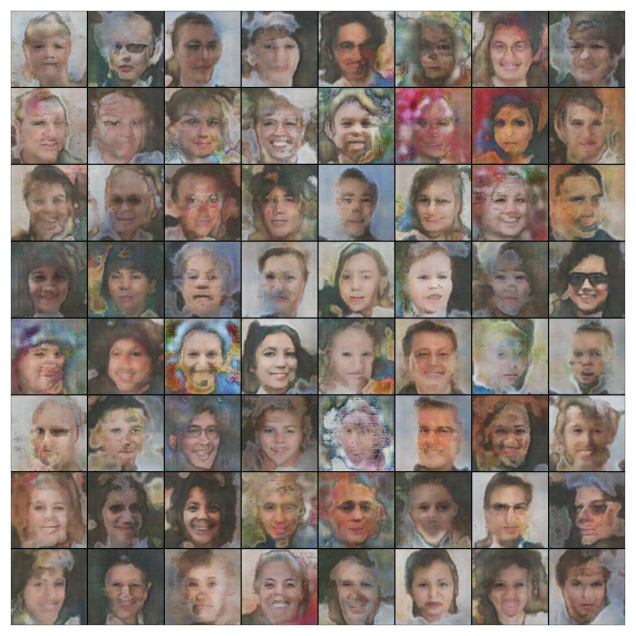

In [ ]:
lr = 3e-4
epochs = 90

model = {
    "discriminator": discriminator,
    "generator": generator
}

# Перемещаем данные на устройство
data = DeviceDataLoader(data, device)

losses_g, losses_d = fit(model, epochs, lr)

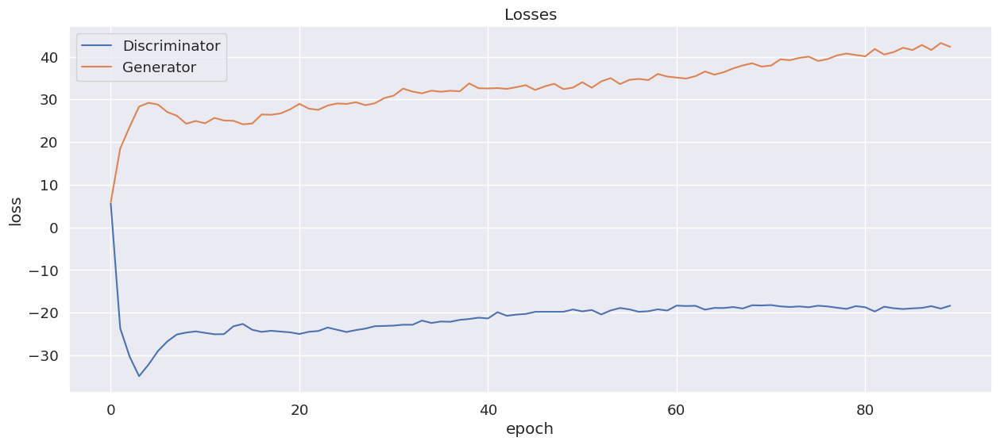

In [ ]:
#  Постройте графики лосса для генератора и дискриминатора

plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses')
plt.show()

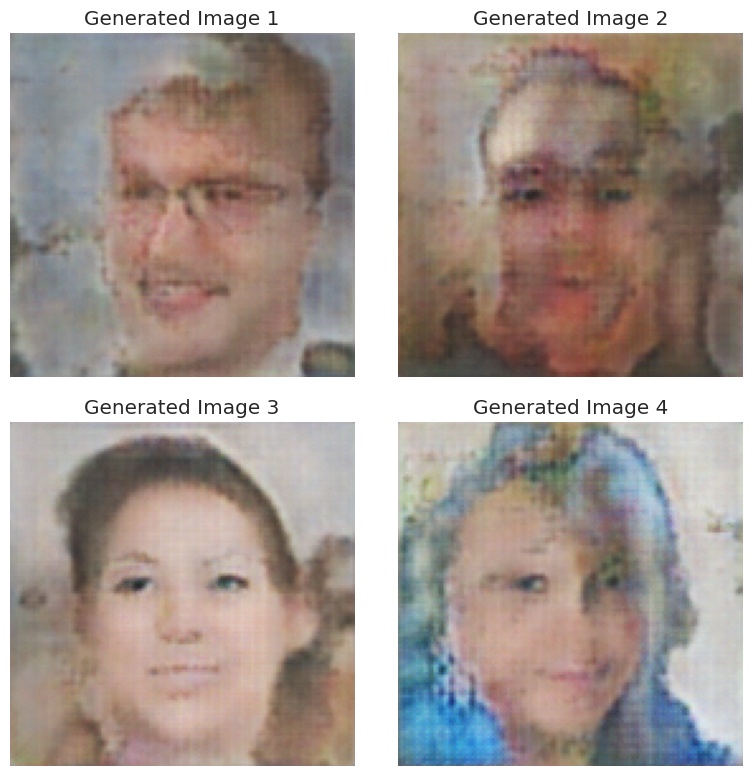

In [ ]:
## Часть 3. Генерация изображений
'''
Оценим качество получившихся изображений. Напишите функцию, которая выводит изображения, сгенерированные нашим генератором
'''

def show_generated_images(generator, n_images=4, device=None, fixed_noise=None):
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Если шум не предоставлен, создание нового
    if fixed_noise is None:
        fixed_noise = torch.randn(n_images, latent_size, 1, 1, device=device)

    generator.eval()
    with torch.no_grad():
        fake_images = generator(fixed_noise)

    fake_images = denorm(fake_images)

    # размер сетки
    n_rows = int(np.sqrt(n_images))
    n_cols = int(np.ceil(n_images / n_rows))

    # сетка изображений
    plt.figure(figsize=(n_cols * 4, n_rows * 4))

    for i in range(n_images):
        plt.subplot(n_rows, n_cols, i + 1)

        # Преобразуем тензор в изображение
        img = fake_images[i].cpu().permute(1, 2, 0).numpy()

        # Обрезка значения до диапазона [0, 1]
        img = np.clip(img, 0, 1)

        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Generated Image {i+1}')

    plt.tight_layout()
    plt.show()

n_images = 4
fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
show_generated_images(model["generator"], n_images, device, fixed_latent)

In [ ]:
""" О качестве получившихся изображений. Подсчет accuracy

Часть 4. Leave-one-out-1-NN classifier accuracy

4.1. Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах,
  кроме одного, проверить качество (accuracy) на оставшемся объекте.
"""

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import accuracy_score
import numpy as np
import tqdm

def evaluate_generator_with_1nn(generator, data_loader, max_samples, latent_size, device=None):
    """
    Оценка качества генератора с помощью 1NN классификатора и leave-one-out кросс-валидации

    param data_loader: загрузчик данных с реальными изображениями
    param latent_size: размерность скрытого пространства генератора
    return: точность классификации
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Получение всех реальных изображений из загрузчика
    real_images = []
    count = 0
    for images, _ in data_loader:
        real_images.append(images.cpu())
        count += images.size(0)
        if count >= max_samples:
            break

    real_images = torch.cat(real_images, dim=0)[:max_samples]
    num_samples = real_images.size(0)

    print(f"Получено {num_samples} реальных изображений")
    batch_size = data_loader.dl.batch_size
    # Генерация такого же количества фейковых изображений
    generator.eval()
    fake_images = []

    with torch.no_grad():
        for i in range(0, num_samples, batch_size):
            batch_size = min(batch_size, num_samples - i)
            z = torch.randn(batch_size, latent_size, 1, 1, device=device)
            batch_fake = generator(z)
            fake_images.append(batch_fake.cpu())

    fake_images = torch.cat(fake_images, dim=0)[:num_samples]  # Убеждаемся, что у нас ровно num_samples изображений

    print(f"Сгенерировано {fake_images.size(0)} фейковых изображений")

    # Преобразование изображений в плоские векторы признаков
    real_features = real_images.reshape(num_samples, -1).numpy()
    fake_features = fake_images.reshape(fake_images.size(0), -1).numpy()

    # Объединение данных и создание меток классов
    X = np.vstack([real_features, fake_features])
    y = np.hstack([np.ones(num_samples), np.zeros(fake_images.size(0))])

    # Применение Leave-One-Out кросс-валидации
    loo = LeaveOneOut()
    clf = KNeighborsClassifier(n_neighbors=1)

    y_true = []
    y_pred = []

    for train_index, test_index in tqdm.tqdm(loo.split(X), total=len(X), desc="LeaveOneOut CV"):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        clf.fit(X_train, y_train)
        pred = clf.predict(X_test)

        y_true.append(y_test[0])
        y_pred.append(pred[0])

    # Расчет точности
    accuracy = accuracy_score(y_true, y_pred)
    print(f"Leave-One-Out 1NN Accuracy: {accuracy:.4f}")

    return accuracy

accuracy = evaluate_generator_with_1nn(model["generator"], data, 300, latent_size, device)
print (accuracy)

Получено 300 реальных изображений
Сгенерировано 300 фейковых изображений


LeaveOneOut CV: 100%|██████████| 600/600 [03:56<00:00,  2.53it/s]

Leave-One-Out 1NN Accuracy: 0.5783
0.5783333333333334


In [1]:
"""О получившемся результате:

Хотим получить точность около 0.5 или ниже (это означает, что классификатор не может различить реальные и сгенерированные изображения,
что указывает на хорошее качество генератора)"""

'О получившемся результате:\n\nХотим получить точность около 0.5 или ниже (это означает, что классификатор не может различить реальные и сгенерированные изображения, \nчто указывает на хорошее качество генератора)'

Сбор реальных изображений...


  0%|          | 0/50 [00:00<?, ?it/s]

Генерация 100 фейковых изображений...


  0%|          | 0/2 [00:00<?, ?it/s]

Преобразование изображений в векторы признаков...
Применение t-SNE (perplexity=30)...


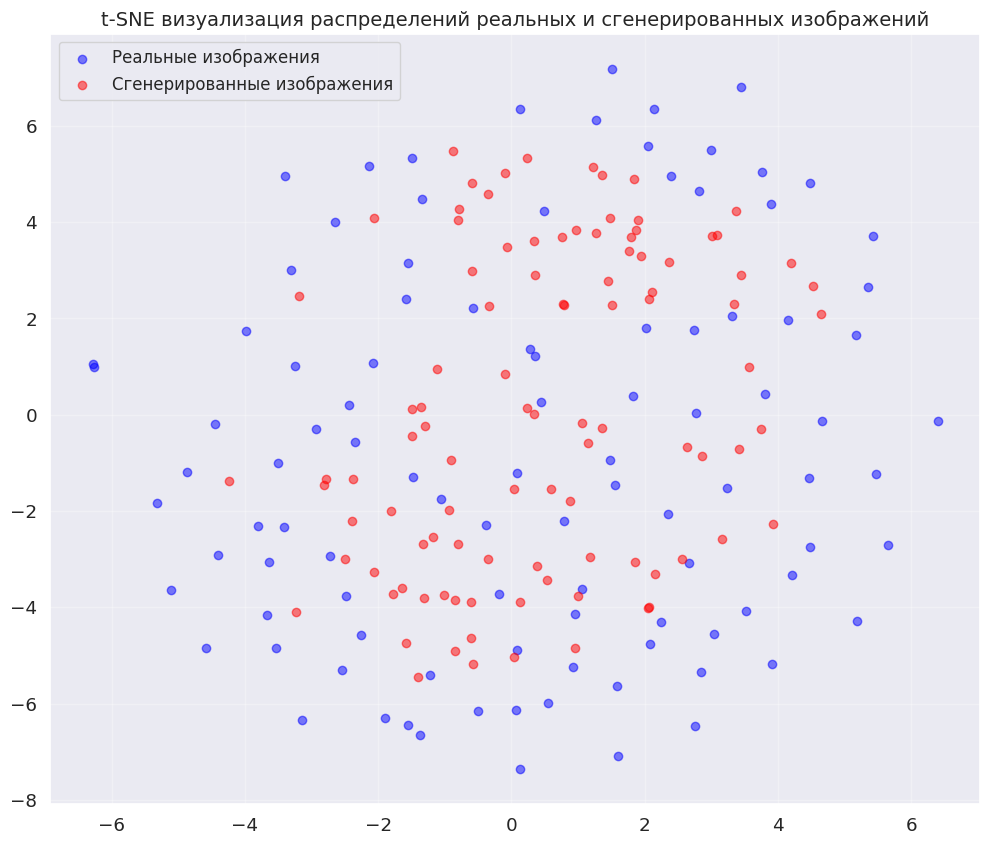

In [ ]:
"""
4.2. Визуализируем распределения для оценки, насколько похожи распределения настоящих и фейковых изображений.
Для этого воспользуемся методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

"""


from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np
import torch
from tqdm.notebook import tqdm

def visualize_distributions_tsne(generator, data_loader, latent_size, n_samples=100,
                                 perplexity=30, device=None):
    """
    Визуализация распределений реальных и сгенерированных изображений с помощью t-SNE
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Сбор реальных изображений
    print("Сбор реальных изображений...")
    real_images = []
    count = 0

    for images, _ in tqdm(data_loader):
        batch_size = images.size(0)
        real_images.append(images.cpu())
        count += batch_size
        if count >= n_samples:
            break

    real_images = torch.cat(real_images, dim=0)[:n_samples]

    # Генерация фейковых изображений
    print(f"Генерация {n_samples} фейковых изображений...")
    generator.eval()
    fake_images = []
    batch_size = data_loader.dl.batch_size
    with torch.no_grad():
        for i in tqdm(range(0, n_samples, batch_size)):
            batch_size = min(batch_size, n_samples - i)
            z = torch.randn(batch_size, latent_size, 1, 1, device=device)
            batch_fake = generator(z)
            fake_images.append(batch_fake.cpu())

    fake_images = torch.cat(fake_images, dim=0)[:n_samples]

    # Преобразование изображений в векторы признаков
    print("Преобразование изображений в векторы признаков...")
    real_features = real_images.reshape(real_images.size(0), -1).numpy()
    fake_features = fake_images.reshape(fake_images.size(0), -1).numpy()

    # Объединение данных
    X = np.vstack([real_features, fake_features])

    # Создание меток (0 для реальных, 1 для фейковых)
    y = np.hstack([np.zeros(real_images.size(0)), np.ones(fake_images.size(0))])

    # Применение t-SNE для снижения размерности
    print(f"Применение t-SNE (perplexity={perplexity})...")
    tsne = TSNE(n_components=2, perplexity=perplexity, n_iter=1000, random_state=42)
    X_tsne = tsne.fit_transform(X)

    # Разделение результатов
    real_tsne = X_tsne[:real_images.size(0)]
    fake_tsne = X_tsne[real_images.size(0):]

    # Визуализация
    plt.figure(figsize=(12, 10))

    plt.scatter(real_tsne[:, 0], real_tsne[:, 1], c='blue', alpha=0.5, label='Реальные изображения')
    plt.scatter(fake_tsne[:, 0], fake_tsne[:, 1], c='red', alpha=0.5, label='Сгенерированные изображения')

    plt.title('t-SNE визуализация распределений реальных и сгенерированных изображений', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(alpha=0.3)

    plt.show()

    # Возвращаем координаты t-SNE для возможного дальнейшего анализа
    return real_tsne, fake_tsne

n_samples = 100  # меньшее количество для ускорения расчетов
real_tsne, fake_tsne = visualize_distributions_tsne(model["generator"], data, latent_size, n_samples, device=device)